In [1]:
# fake_watermark
# https://drive.google.com/file/d/1tDe15P-X38pWtREM5KKCN5eaQ5jCo9WH/view?usp=share_link
!gdown --id 1tDe15P-X38pWtREM5KKCN5eaQ5jCo9WH
!unzip fake_watermark.zip

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1tDe15P-X38pWtREM5KKCN5eaQ5jCo9WH
To: /content/fake_watermark.zip
100% 25.5M/25.5M [00:00<00:00, 98.7MB/s]
Archive:  fake_watermark.zip
   creating: fake_watermark/
   creating: fake_watermark/images/
  inflating: fake_watermark/images/0.jpg  
  inflating: fake_watermark/images/1.jpg  
  inflating: fake_watermark/images/2.jpg  
  inflating: fake_watermark/images/3.jpg  
  inflating: fake_watermark/images/4.jpg  
  inflating: fake_watermark/images/5.jpg  
  inflating: fake_watermark/images/6.jpg  
  inflating: fake_watermark/images/7.jpg  
  inflating: fake_watermark/images/8.jpg  
  inflating: fake_watermark/images/9.jpg  
  inflating: fake_watermark/images/10.jpg  
  inflating: fake_watermark/images/11.jpg  
  inflating: f

In [2]:
import numpy as np
import cv2
import os
import random
import glob
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.patches as patches

In [3]:
# Load the watermarked images
watermark_images = glob.glob('fake_watermark/images/*.jpg')

# Load the corresponding annotations
annotation_files = glob.glob('fake_watermark/annotations/*.txt')

In [4]:
# Define the function to preprocess the data
def preprocess_data(watermark_image, annotation_file):
    # Load the image
    image = cv2.imread(watermark_image)
    # plt.imshow(image)
    # plt.show()
    
    # Load the annotation file
    annotation = np.loadtxt(annotation_file)
    
    # Extract the coordinates of the bounding box
    class_label = int(annotation[0])
    x_center = float(annotation[1])
    y_center = float(annotation[2])
    width = float(annotation[3])
    height = float(annotation[4])
    
    print(x_center, y_center, width, height)
    print(image.shape)

    x_center = 0.8
    y_center = 0.95
    width = 0.2
    height = 0.05

    # Convert the bounding box coordinates to top-left and bottom-right coordinates
    x1 = int((x_center - width/2) * image.shape[1])
    y1 = int((y_center - height/2) * image.shape[0])
    x2 = int((x_center + width/2) * image.shape[1])
    y2 = int((y_center + height/2) * image.shape[0])
    print(x1,y1,x2,y2)
    
    # Crop the image to the region of interest
    image_roi = image[int(y1):int(y2), int(x1):int(x2)]

    fig, ax = plt.subplots()
    ax.imshow(image)
    rect = patches.Rectangle((int(x1), int(y1)), width, height, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    plt.show()
    
    # Resize the image to a fixed size
    image_resized = cv2.resize(image_roi, (512, 512))
    
    # Normalize the pixel values to be between 0 and 1
    image_normalized = image_resized / 255.0
    
    # Return the preprocessed image and the annotation
    return image_normalized, annotation[0]

# Define the function to generate the training data
def generate_data(images, annotations, batch_size):
    while True:
        # Shuffle the images and annotations
        data = list(zip(images, annotations))
        random.shuffle(data)
        images, annotations = zip(*data)
        
        # Generate the training data in batches
        for i in range(0, len(images), batch_size):
            batch_images = []
            batch_labels = []
            for j in range(i, min(i + batch_size, len(images))):
                image, label = preprocess_data(images[j], annotations[j])
                batch_images.append(image)
                batch_labels.append(label)
            yield np.array(batch_images), np.array(batch_labels)


In [5]:
# Define the model architecture
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=optimizers.Adam(lr=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


In [6]:
# Define the batch size and number of epochs
batch_size = 32
epochs = 50

# Define the callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5)
model_checkpoint = ModelCheckpoint('model.h5', monitor='val_loss', save_best_only=True)


In [7]:
training_data = generate_data(watermark_images[:int(len(watermark_images)*0.8)], annotation_files[:int(len(annotation_files)*0.8)], batch_size)
validation_data = generate_data(watermark_images[int(len(watermark_images)*0.8):], annotation_files[int(len(annotation_files)*0.8):], batch_size)

0.193359375 0.01953125 0.388671875 0.388671875
(512, 512, 3)
358 473 460 499


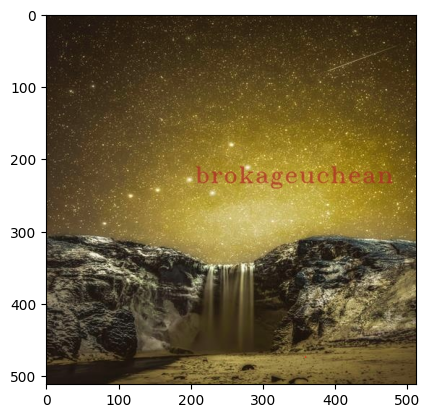

0.1953125 0.0234375 0.390625 0.390625
(512, 512, 3)
358 473 460 499


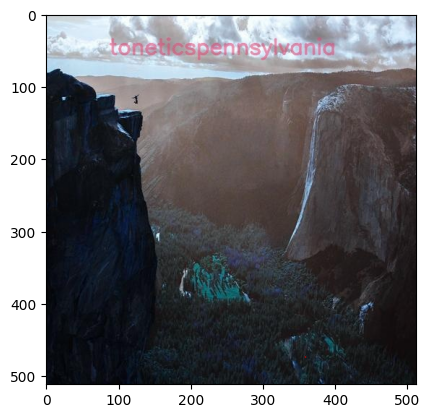

0.146484375 0.013671875 0.29296875 0.29296875
(512, 512, 3)
358 473 460 499


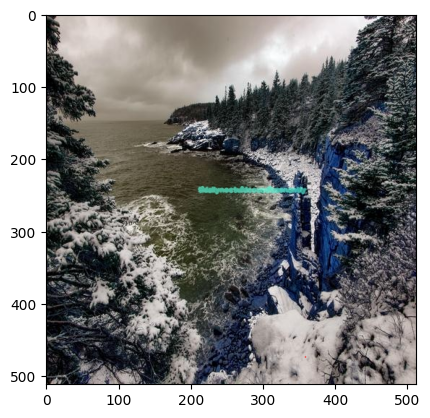

0.28515625 0.025390625 0.5703125 0.5703125
(512, 512, 3)
358 473 460 499


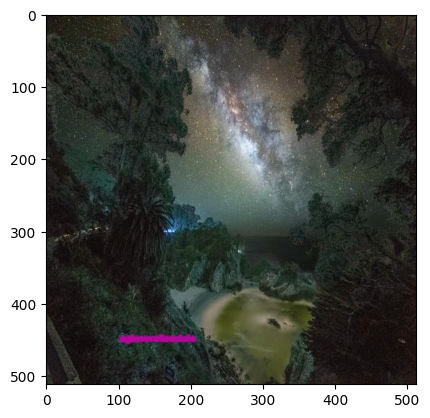

0.0703125 0.015625 0.142578125 0.142578125
(512, 512, 3)
358 473 460 499


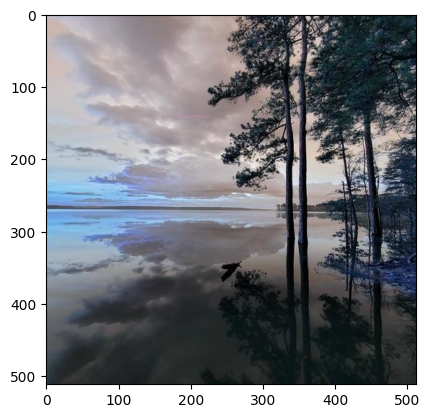

0.0546875 0.01953125 0.111328125 0.111328125
(512, 512, 3)
358 473 460 499


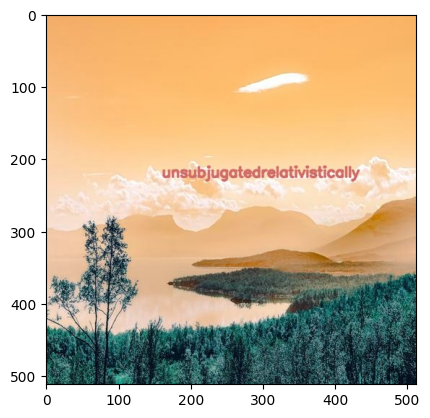

0.142578125 0.0234375 0.287109375 0.287109375
(512, 512, 3)
358 473 460 499


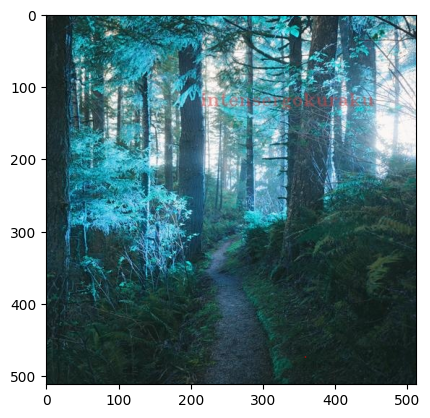

0.068359375 0.013671875 0.138671875 0.138671875
(512, 512, 3)
358 473 460 499


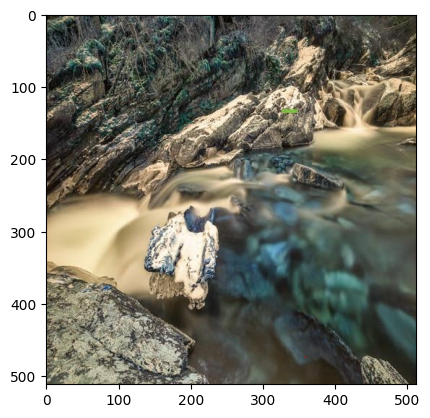

0.0625 0.02734375 0.126953125 0.126953125
(512, 512, 3)
358 473 460 499


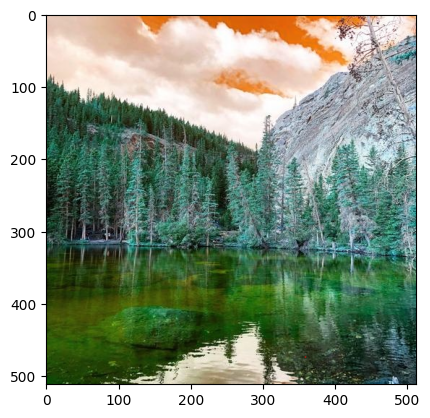

0.244140625 0.025390625 0.48828125 0.48828125
(512, 512, 3)
358 473 460 499


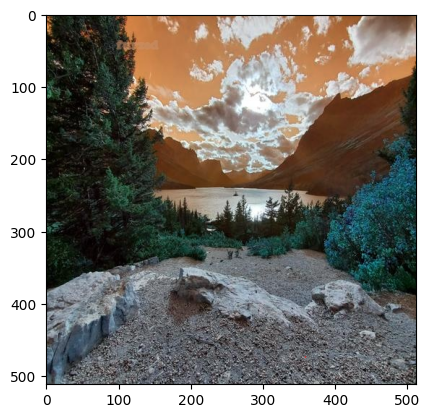

0.0546875 0.017578125 0.111328125 0.111328125
(512, 512, 3)
358 473 460 499


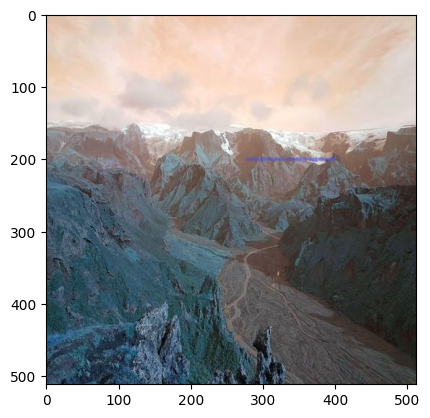

0.17578125 0.01953125 0.3515625 0.3515625
(512, 512, 3)
358 473 460 499


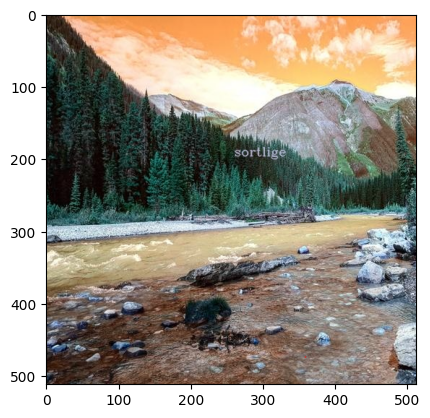

0.1953125 0.017578125 0.392578125 0.392578125
(512, 512, 3)
358 473 460 499


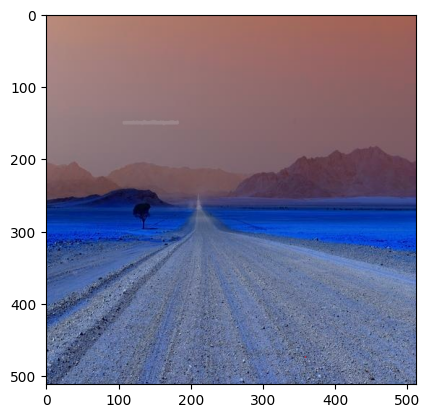

0.150390625 0.017578125 0.302734375 0.302734375
(512, 512, 3)
358 473 460 499


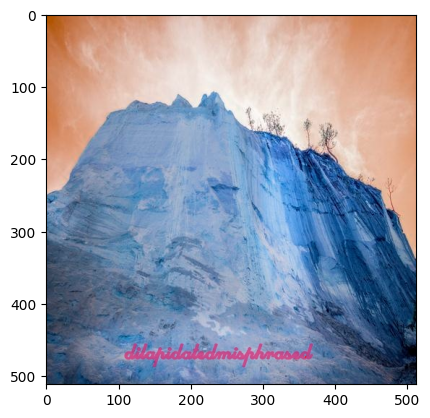

0.333984375 0.0234375 0.66796875 0.66796875
(512, 512, 3)
358 473 460 499


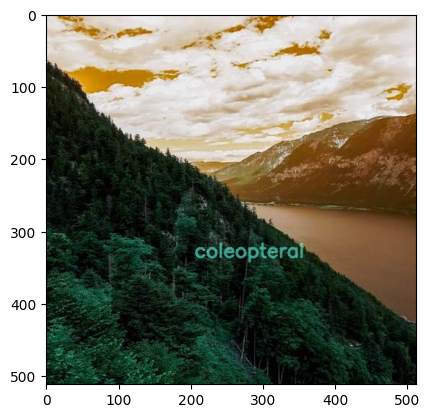

0.2265625 0.03125 0.455078125 0.455078125
(512, 512, 3)
358 473 460 499


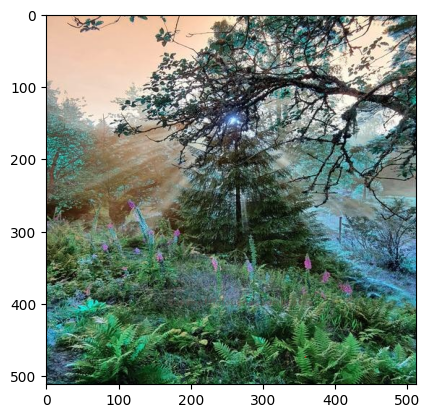

0.0546875 0.017578125 0.111328125 0.111328125
(512, 512, 3)
358 473 460 499


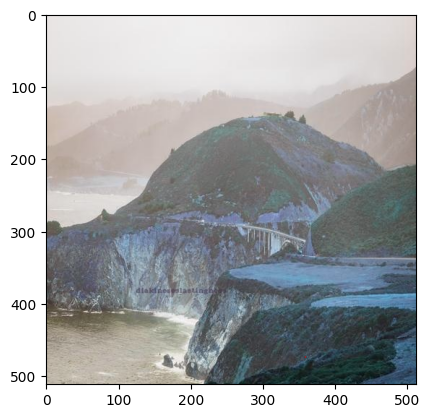

0.11328125 0.017578125 0.228515625 0.228515625
(512, 512, 3)
358 473 460 499


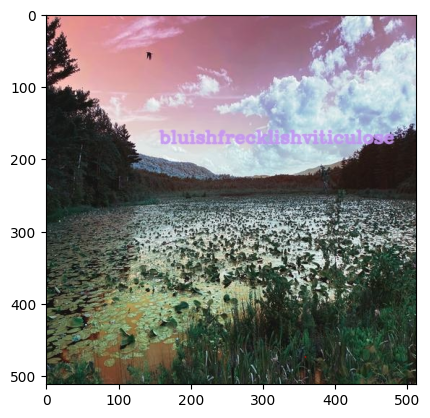

0.060546875 0.029296875 0.123046875 0.123046875
(512, 512, 3)
358 473 460 499


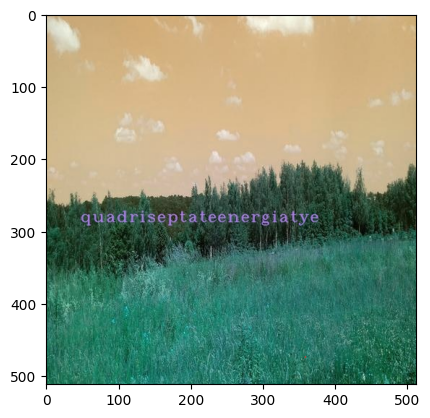

0.11328125 0.0234375 0.2265625 0.2265625
(512, 512, 3)
358 473 460 499


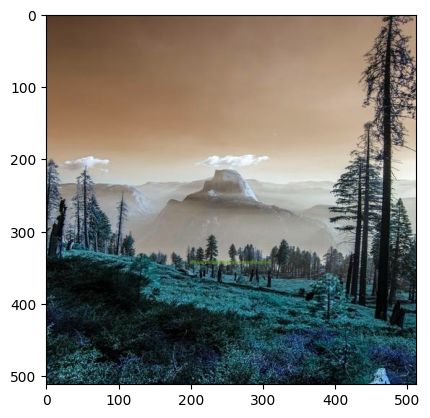

0.333984375 0.0234375 0.669921875 0.669921875
(512, 512, 3)
358 473 460 499


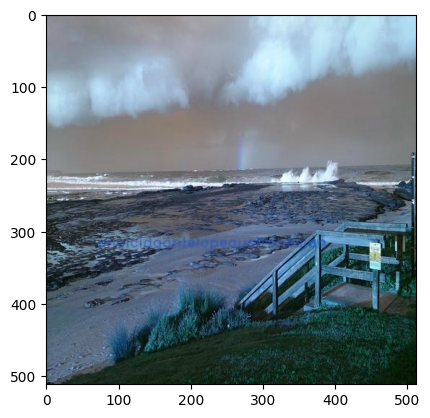

0.181640625 0.021484375 0.36328125 0.36328125
(512, 512, 3)
358 473 460 499


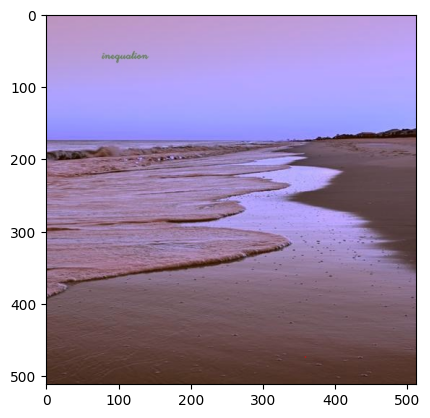

0.154296875 0.03515625 0.30859375 0.30859375
(512, 512, 3)
358 473 460 499


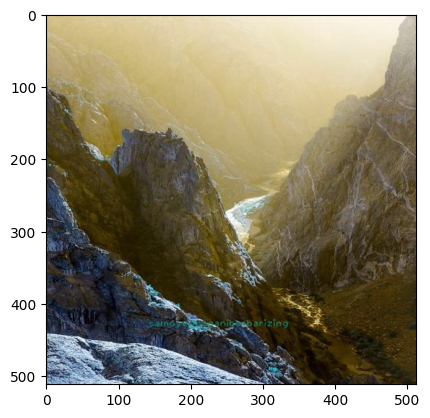

0.177734375 0.021484375 0.35546875 0.35546875
(512, 512, 3)
358 473 460 499


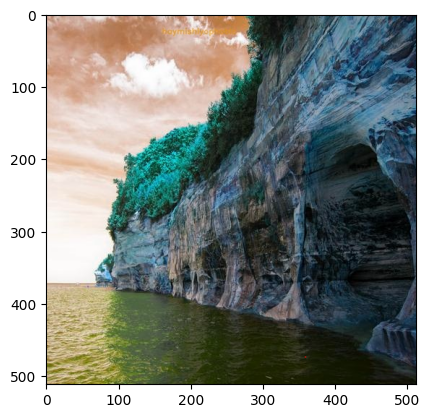

0.109375 0.017578125 0.21875 0.21875
(512, 512, 3)
358 473 460 499


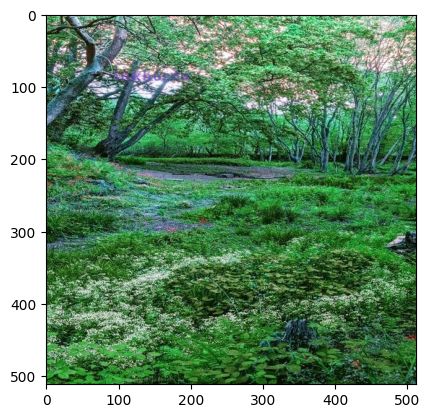

0.13671875 0.015625 0.2734375 0.2734375
(512, 512, 3)
358 473 460 499


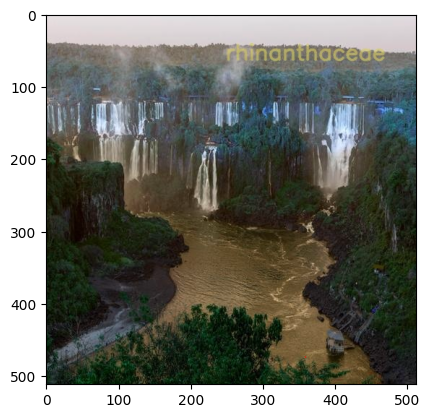

0.130859375 0.0234375 0.263671875 0.263671875
(512, 512, 3)
358 473 460 499


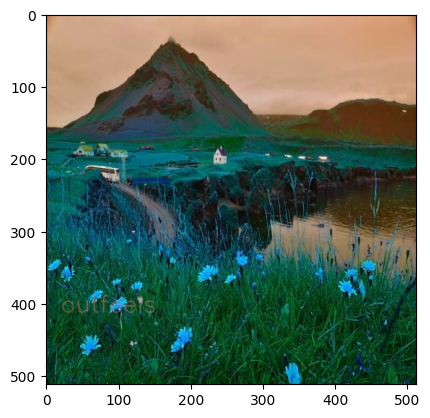

0.08203125 0.013671875 0.166015625 0.166015625
(512, 512, 3)
358 473 460 499


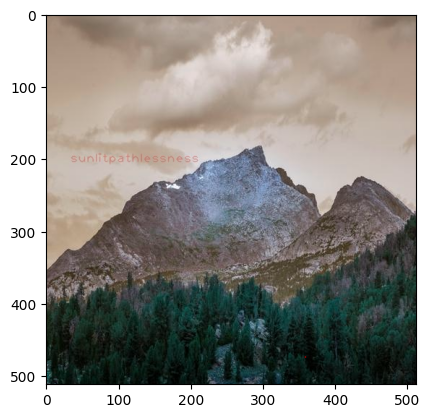

0.06640625 0.013671875 0.134765625 0.134765625
(512, 512, 3)
358 473 460 499


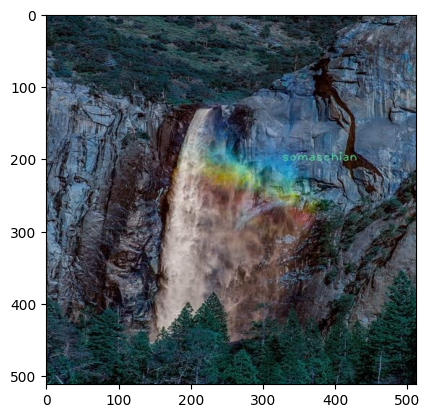

0.130859375 0.017578125 0.263671875 0.263671875
(512, 512, 3)
358 473 460 499


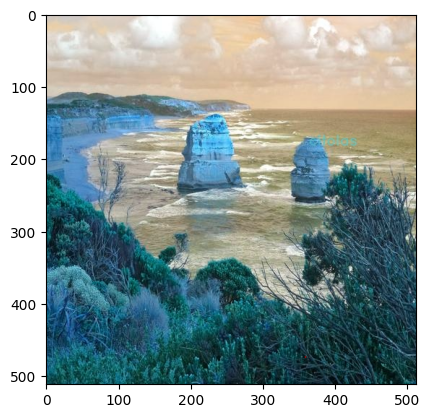

0.294921875 0.029296875 0.591796875 0.591796875
(512, 512, 3)
358 473 460 499


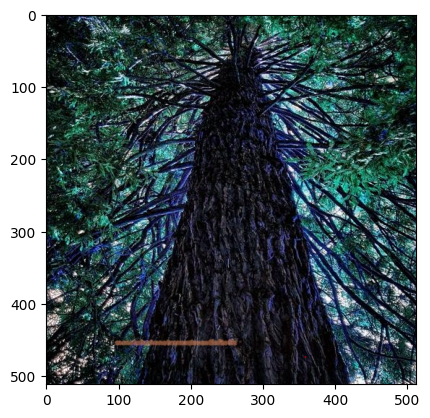

0.119140625 0.013671875 0.23828125 0.23828125
(512, 512, 3)
358 473 460 499


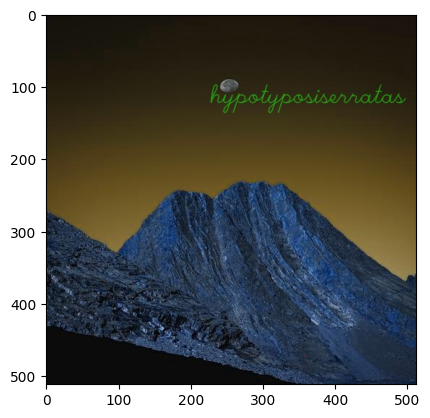

Epoch 1/50
0.298828125 0.03125 0.59765625 0.59765625
(512, 512, 3)
358 473 460 499


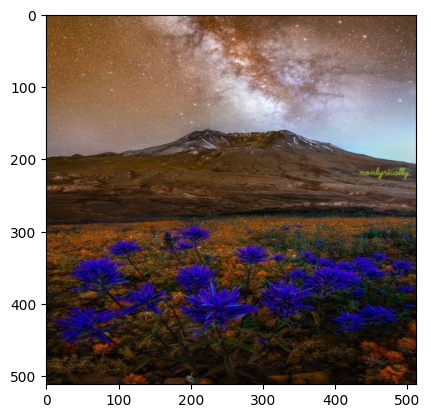

0.09375 0.025390625 0.189453125 0.189453125
(512, 512, 3)
358 473 460 499


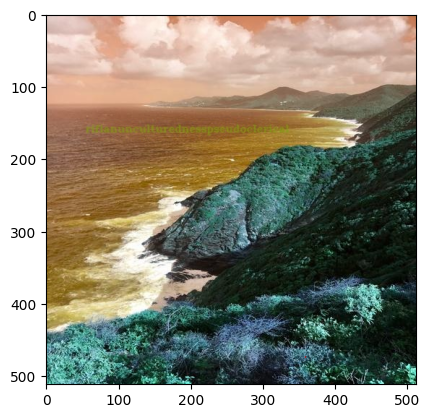

0.0859375 0.013671875 0.171875 0.171875
(512, 512, 3)
358 473 460 499


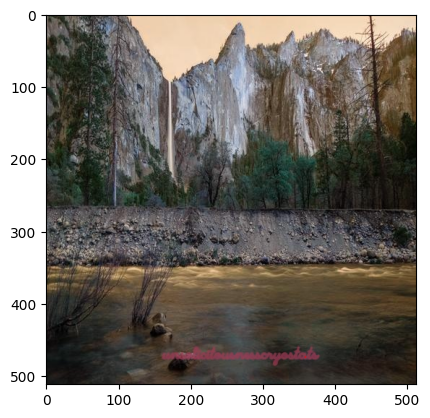

0.185546875 0.017578125 0.373046875 0.373046875
(512, 512, 3)
358 473 460 499


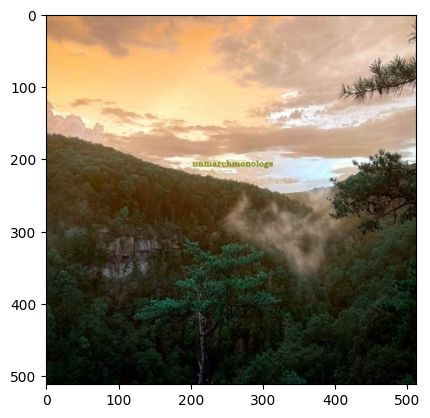

0.1015625 0.017578125 0.205078125 0.205078125
(512, 512, 3)
358 473 460 499


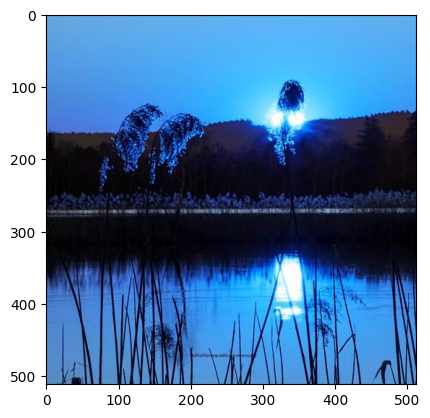

0.083984375 0.017578125 0.169921875 0.169921875
(512, 512, 3)
358 473 460 499


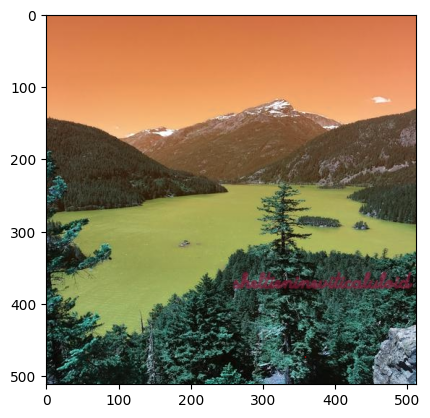

0.046875 0.015625 0.095703125 0.095703125
(512, 512, 3)
358 473 460 499


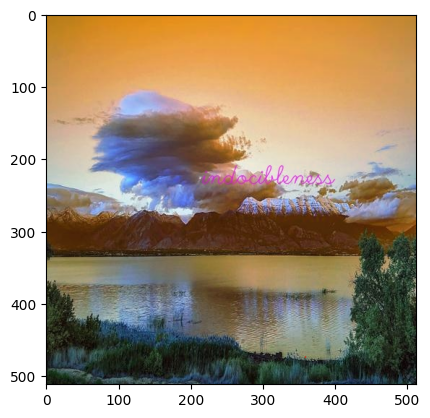

0.119140625 0.033203125 0.240234375 0.240234375
(512, 512, 3)
358 473 460 499


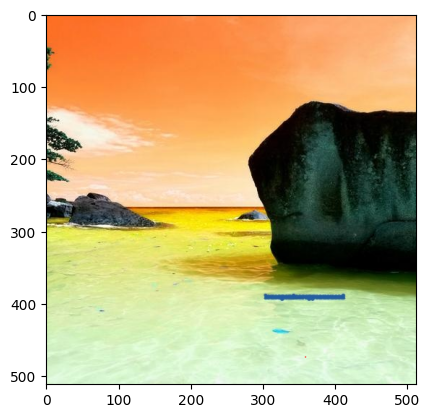

0.181640625 0.0234375 0.365234375 0.365234375
(512, 512, 3)
358 473 460 499


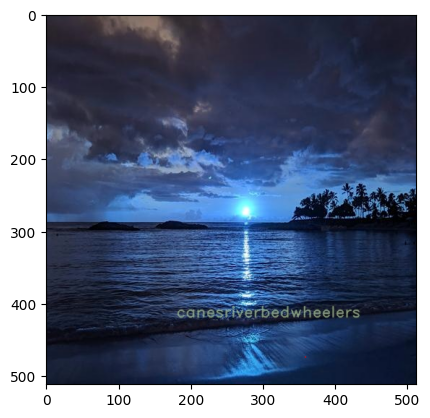

0.048828125 0.017578125 0.09765625 0.09765625
(512, 512, 3)
358 473 460 499


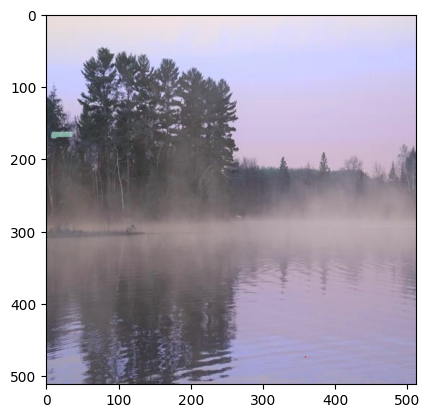

0.0625 0.015625 0.125 0.125
(512, 512, 3)
358 473 460 499


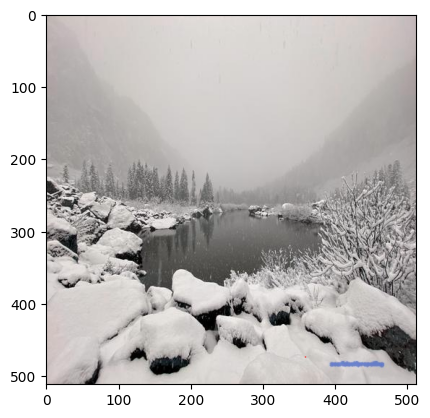

0.080078125 0.021484375 0.162109375 0.162109375
(512, 512, 3)
358 473 460 499


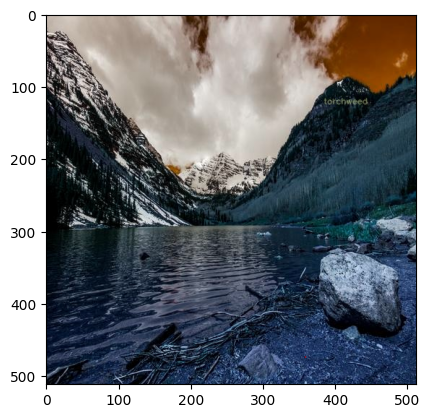

0.14453125 0.017578125 0.2890625 0.2890625
(512, 512, 3)
358 473 460 499


InvalidArgumentError: ignored

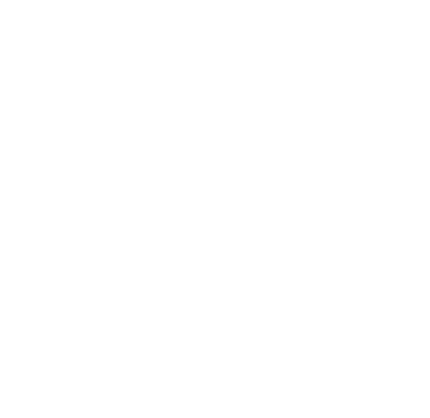

0.1328125 0.015625 0.265625 0.265625
(512, 512, 3)
358 473 460 499


Done: ignored

<Figure size 640x480 with 1 Axes>

In [8]:
history = model.fit(training_data,
  epochs=epochs,
  steps_per_epoch=int(len(watermark_images)*0.8) // batch_size,
  validation_data=validation_data,
  validation_steps=int(len(watermark_images)*0.2) // batch_size,
  callbacks=[early_stopping, model_checkpoint])

In [ ]:
test_images = glob.glob('fake_watermark/images/0.jpg')
test_annotations = glob.glob('fake_watermark/annotations/0.txt')

test_data = generate_data(test_images, test_annotations, batch_size)

loss, accuracy = model.evaluate(test_data, steps=len(test_images) // batch_size)

print('Test loss:', loss)
print('Test accuracy:', accuracy)